In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import nltk 
import random
import tensorflow as tf
random.seed(10)

In [2]:
def creat_bigramns(a):
    ans=[]
    n=""
    d=0
    stop=[",","&","%","$","#",";",":","(",")","{","]","[","]","@",".","/","/n","!","?","\n"," ","0","1","2","3","4","5","6","7","8","9","-","_","+"]
    for j in a:
        if j=="<":
            d=1
        elif j==">":
            d=0
        elif d==0 and j not in stop:
            n+=j
            if len(n)==2:
                ans.append(n)
                n=j
    return ans 

In [3]:
def makes_lines(a,lang=None):
    x=[]
    y=[]
    for i in a:
        ans=creat_bigramns(i.lower())
        x.append(ans)
        y.append(lang)
    return x,y

In [4]:
makes_lines(["This is a sentences, to check bigram program","Lets see what is the output","hhh"])

([['th',
   'hi',
   'is',
   'si',
   'is',
   'sa',
   'as',
   'se',
   'en',
   'nt',
   'te',
   'en',
   'nc',
   'ce',
   'es',
   'st',
   'to',
   'oc',
   'ch',
   'he',
   'ec',
   'ck',
   'kb',
   'bi',
   'ig',
   'gr',
   'ra',
   'am',
   'mp',
   'pr',
   'ro',
   'og',
   'gr',
   'ra',
   'am'],
  ['le',
   'et',
   'ts',
   'ss',
   'se',
   'ee',
   'ew',
   'wh',
   'ha',
   'at',
   'ti',
   'is',
   'st',
   'th',
   'he',
   'eo',
   'ou',
   'ut',
   'tp',
   'pu',
   'ut'],
  ['hh', 'hh']],
 [None, None, None])

In [5]:
data=[]
label=[]

In [6]:
bbc_igbo=open("bbc-igbo.txt","r",encoding="utf8")
lines=bbc_igbo.readlines()
x,y=makes_lines(lines,'Igbo')
for i in range(0,len(x)):
    if len(x[i])!=0:
        data.append(x[i])
        label.append(y[i])
print(len(label))
bbc_igbo.close()

33711


In [7]:
eng=open("english.txt","r")
lines=eng.readlines()
x,y=makes_lines(lines,'English')
for i in range(0,len(x)):
    if len(x[i])!=0:
        data.append(x[i])
        label.append(y[i])
print(len(label))
eng.close()

133162


In [8]:
czh=open("czech.txt","r")
lines=czh.readlines()
x,y=makes_lines(lines,'Czech')
for i in range(0,len(x)):
    if len(x[i])!=0:
        data.append(x[i])
        label.append(y[i])
print(len(label))
czh.close()

212975


In [9]:
def ret_uniq(a):
    ans=[]
    for i in a:
        k=np.unique(i)
        for j in k:
            if j in ans:
                pass
            else:
                ans.append(j)
    ans=np.array(ans)
    return ans
data_a=np.array(data)
uni_ret=ret_uniq(data_a)
print(uni_ret)

['ae' 'ag' 'ak' ... 'ò©' 'sã' 'ão']


In [10]:
def top_k(data,uni_ret,k=200):
    c={}
    for i in uni_ret:
        c[i]=0
    for i in data:
        for j in i:
            c[j]+=1
    #print(c)
    ans=[]
    for i in range(0,k):
        max_l=0
        for a,b in c.items():
            if b>=max_l and a not in ans:
                l=a
                max_l=b
        ans.append(l)
    ans=np.array(ans)
    return ans
k_200=top_k(data_a,uni_ret)
print(k_200)

['an' 'th' 'en' 'he' 'in' 'st' 'er' 'na' 'on' 'es' 'ch' 'al' 're' 'te'
 'at' 'ed' 'to' 'la' 'le' 'ro' 'se' 'ti' 'ar' 'ou' 'as' 'ha' 'po' 'nd'
 'ne' 'ra' 'ta' 'it' 'or' 'is' 'em' 'et' 'li' 'nt' 'ho' 'ak' 'ma' 'ov'
 'ea' 'me' 'no' 'el' 'do' 'os' 'od' 'il' 'de' 've' 'si' 'am' 'ad' 'ri'
 'ní' 'ce' 'ot' 'pr' 'ka' 'ol' 'om' 'lo' 'ic' 'ng' 'hi' 'so' 'je' 'of'
 'ec' 'ni' 'ko' 'be' 'di' 'sa' 'co' 'ob' 'da' 'wa' 'mi' 'ab' 'aa' 'ac'
 'un' 'ep' 'us' 'tr' 'va' 'av' 'ny' 'ur' 'io' 'ap' 'mo' 'pa' 'ee' 'ev'
 'ut' 'eb' 'ek' 'ke' 'op' 'øe' 'ok' 'ba' 'll' 'we' 'ly' 'ir' 'tu' 'pe'
 'ag' 'pø' 'eo' 'sh' 'by' 'rt' 'ia' 'id' 'ei' 'ns' 'im' 'sp' 'dn' 'nì'
 '¾e' 'tt' 'nc' 'bu' 'za' 'ci' 'bo' 'ai' 'ru' 'ej' 'ik' 'ya' 'ga' 'ie'
 'iv' 'dị' 'kw' 'fo' 'rs' 'vi' 'ji' 'ss' 'gh' 'ca' 'sk' 'oc' 'ah' 'ts'
 'ul' 'up' 'ge' 'vo' 'ew' 'eg' 'ku' 'eh' 'ez' 'ye' 'gb' 'oh' 'ys' 'nw'
 'oz' 'ná' 'oo' 'dt' 'íc' 'mu' 'ud' 'nk' 'n’' 'ím' 'vy' 'sl' 'ig' 'aj'
 'fi' 'hl' 'ef' 'ow' 'kt' 'wi' 'mp' 'wh' 'pl' 'øí' 'nu' 'ld' 'lu' 'bụ'
 'vì' 

In [11]:
print(uni_ret.shape[0],data_a.shape[0])

2346 212975


In [12]:
def emb(data,uni_ret,n=20):
    ans=[]
    for i in data:
        a=np.zeros([n,uni_ret.shape[0]])
        k=0
        for j in i:
            x=np.where(uni_ret==j)
            a[k][x]=1
            k+=1
            if k==n:
                break
        ans.append(a)
    ans=np.array(ans)
    return ans
data_1=emb(data_a,k_200)
print(data_1[0])

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [13]:
def conv_label(y):
    ans=[]
    for i in y:
        if i=="Czech":
            ans.append([0,0,1])
        elif i=="English":
            ans.append([0,1,0])
        else:
            ans.append([1,0,0])
    return ans
label_a=conv_label(label)

In [14]:
temp = list(zip(data_1, label_a)) 
random.shuffle(temp) 
x, y = zip(*temp) 

In [15]:
import sklearn
from sklearn.model_selection import train_test_split

In [16]:
x_train,x,y_train,y=train_test_split(x,y,test_size=0.2,random_state=42)
x_test,x_val,y_test,y_val=train_test_split(x,y,test_size=0.5,random_state=42)

In [17]:
x_train=np.array(x_train)
x_train.shape
x_train= x_train.reshape((x_train.shape[0],x_train.shape[1]*x_train.shape[2]))
x_train.shape

(170380, 4000)

In [18]:
y_train=np.array(y_train)
def new_y(y):
    ans=[]
    for i in y:
        if i[1]==1:
            ans.append(1)
        elif i[2]==1:
            ans.append(2)
        else:
            ans.append(3)
    ans=np.array(ans)
    return ans
y_train_2=new_y(y_train)

In [19]:
x_test=np.array(x_test)
x_test= x_test.reshape((x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
x_test.shape

(21297, 4000)

In [20]:
x_val=np.array(x_val)
x_val= x_val.reshape((x_val.shape[0],x_val.shape[1]*x_val.shape[2]))
x_val.shape
y_val=np.array(y_val)
y_val_2=new_y(y_val)

In [21]:
from sklearn.naive_bayes import GaussianNB
gb=GaussianNB()
gb.fit(x_train,y_train_2)
print(gb.score(x_train,y_train_2))
print(gb.score(x_val,y_val_2))

0.9048714637868295
0.9035120668607381


In [22]:
from sklearn.metrics import classification_report
y_pred=gb.predict(x_val)
print(classification_report(y_val_2, y_pred, target_names=["Czech","English","Igbo"]))

              precision    recall  f1-score   support

       Czech       0.88      0.96      0.92      9897
     English       0.99      0.82      0.90      8043
        Igbo       0.82      0.94      0.88      3358

    accuracy                           0.90     21298
   macro avg       0.90      0.91      0.90     21298
weighted avg       0.91      0.90      0.90     21298



In [23]:
from sklearn.tree import DecisionTreeClassifier
for i in range(2,10):
    dcr=DecisionTreeClassifier(max_depth=i)
    dcr.fit(x_train,y_train)
    print(i,dcr.score(x_train,y_train),dcr.score(x_val,y_val))

2 0.061744336189693626 0.060944689642219926
3 0.07857142857142857 0.07944407925626819
4 0.09188871933325507 0.09230913700816978
5 0.0983331376922174 0.10024415438069302
6 0.1056755487733302 0.10742792750493003
7 0.11327620612747975 0.11550380317400695
8 0.13119497593614274 0.13390928725701945
9 0.14163634229369645 0.14414499013991924


In [24]:
y_test=np.array(y_test)
def new_y(y):
    ans=[]
    for i in y:
        if i[1]==1:
            ans.append(1)
        elif i[2]==1:
            ans.append(2)
        else:
            ans.append(3)
    ans=np.array(ans)
    return ans
y_test_2=new_y(y_test)

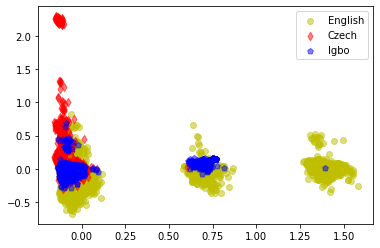

In [25]:
from sklearn.decomposition import PCA
a=PCA(n_components=2).fit_transform(x_test)
#plt.scatter(a[:,0],a[:,1],c=y_test_2)
plt.scatter(a[np.where(y_test_2==1),0],a[np.where(y_test_2==1),1],marker='o',color='y',label='English',alpha=0.5)
plt.scatter(a[np.where(y_test_2==2),0],a[np.where(y_test_2==2),1],marker='d',color='r',label='Czech',alpha=0.5)
plt.scatter(a[np.where(y_test_2==3),0],a[np.where(y_test_2==3),1],marker='p',color='b',label='Igbo',alpha=0.5)
plt.legend(loc='best')
plt.legend(labels=["English","Czech","Igbo"])

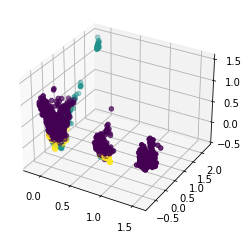

In [26]:
from sklearn.decomposition import PCA
a=PCA(n_components=3).fit_transform(x_test)
import matplotlib.pyplot as plt 
fig = plt.figure() 
ax = plt.axes(projection ='3d') 
ax.scatter(a[:,0],a[:,1],a[:,2],c=y_test_2)

In [27]:
from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model

In [28]:
model=tf.keras.Sequential([
    tf.keras.Input(shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dense(32,activation='relu'),
    tf.keras.layers.Dense(8,activation='relu'),
    tf.keras.layers.Dense(3,activation='sigmoid')])
model.summary()
model.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               512128    
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 264       
_________________________________________________________________
dense_4 (Dense)              (None, 3)                 27        
Total params: 522,755
Trainable params: 522,755
Non-trainable params: 0
_________________________________________________________________


In [29]:
print(type(x_train))
print(type(x_val))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [30]:
history=model.fit(x_train,y_train,batch_size=128,epochs=20,validation_data=(x_val,y_val))

Epoch 1/20
1332/1332 [==============================] - 7s 5ms/step - loss: 0.1098 - accuracy: 0.9341 - val_loss: 0.0725 - val_accuracy: 0.9605
Epoch 2/20
1332/1332 [==============================] - 6s 4ms/step - loss: 0.0523 - accuracy: 0.9717 - val_loss: 0.0662 - val_accuracy: 0.9652
Epoch 3/20
1332/1332 [==============================] - 6s 4ms/step - loss: 0.0265 - accuracy: 0.9863 - val_loss: 0.0760 - val_accuracy: 0.9670
Epoch 4/20
1332/1332 [==============================] - 6s 4ms/step - loss: 0.0121 - accuracy: 0.9940 - val_loss: 0.0918 - val_accuracy: 0.9637
Epoch 5/20
1332/1332 [==============================] - 6s 4ms/step - loss: 0.0065 - accuracy: 0.9966 - val_loss: 0.1065 - val_accuracy: 0.9659
Epoch 6/20
1332/1332 [==============================] - 6s 4ms/step - loss: 0.0040 - accuracy: 0.9979 - val_loss: 0.1276 - val_accuracy: 0.9659
Epoch 7/20
1332/1332 [==============================] - 6s 4ms/step - loss: 0.0026 - accuracy: 0.9985 - val_loss: 0.1507 - val_accuracy:

Text(0.5, 1.0, 'Epoch vs Accuracy')

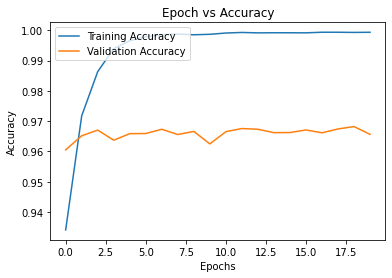

In [31]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['Training Accuracy','Validation Accuracy'],loc='upper left')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.title('Epoch vs Accuracy')

In [32]:
def get_y(y):
    y=np.array(y)
    ans=[]
    for i in y:
        m=np.max(i)
        k=np.where(i==m)
        a=np.zeros(3)
        a[k]=1
        ans.append(a)
    ans=np.array(ans)
    return ans


In [33]:
predictions = model.predict(x_val)
l=get_y(predictions)
print(len(l))
print(classification_report(y_val, l,target_names=["Czech","English","Igbo"]))

21298
              precision    recall  f1-score   support

       Czech       0.94      0.96      0.95      3358
     English       0.97      0.97      0.97      9897
        Igbo       0.98      0.96      0.97      8043

   micro avg       0.97      0.97      0.97     21298
   macro avg       0.96      0.96      0.96     21298
weighted avg       0.97      0.97      0.97     21298
 samples avg       0.97      0.97      0.97     21298



In [34]:
predictions = model.predict(x_val)
#print(predictions)
print(len(new_y(y_val)))
l=get_y(predictions)
print(len(l))
print(classification_report(y_val, l,target_names=["Czech","English","Igbo"]))

21298
21298
              precision    recall  f1-score   support

       Czech       0.94      0.96      0.95      3358
     English       0.97      0.97      0.97      9897
        Igbo       0.98      0.96      0.97      8043

   micro avg       0.97      0.97      0.97     21298
   macro avg       0.96      0.96      0.96     21298
weighted avg       0.97      0.97      0.97     21298
 samples avg       0.97      0.97      0.97     21298



In [35]:
temp = list(zip(data_1, label_a)) 
random.shuffle(temp) 
x, y = zip(*temp) 
x_train,x,y_train,y=train_test_split(x,y,test_size=0.2,random_state=42)
x_test,x_val,y_test,y_val=train_test_split(x,y,test_size=0.5,random_state=42)
x_train=np.array(x_train)
x_val=np.array(x_val)

y_train=np.array(y_train)
y_val=np.array(y_val)

In [36]:
model=tf.keras.Sequential([
    tf.keras.Input(shape=(x_train.shape[1],x_train.shape[2])),
    tf.keras.layers.LSTM(5,activation="relu"),
    tf.keras.layers.Dense(8,activation="relu"),
    tf.keras.layers.Dense(3,activation="softmax")
])
model.summary()
model.compile(optimizer="Adam",loss="binary_crossentropy",metrics=["accuracy"])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 5)                 4120      
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 48        
_________________________________________________________________
dense_6 (Dense)              (None, 3)                 27        
Total params: 4,195
Trainable params: 4,195
Non-trainable params: 0
_________________________________________________________________


In [37]:
history=model.fit(x_train,y_train,batch_size=128,epochs=20,validation_data=(x_val,y_val))

Epoch 1/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.1840 - accuracy: 0.8701 - val_loss: 0.1002 - val_accuracy: 0.9433
Epoch 2/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.0876 - accuracy: 0.9515 - val_loss: 0.0829 - val_accuracy: 0.9523
Epoch 3/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.0801 - accuracy: 0.9552 - val_loss: 0.0806 - val_accuracy: 0.9549
Epoch 4/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.0762 - accuracy: 0.9571 - val_loss: 0.0758 - val_accuracy: 0.9575
Epoch 5/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.0738 - accuracy: 0.9590 - val_loss: 0.0743 - val_accuracy: 0.9589
Epoch 6/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.0722 - accuracy: 0.9596 - val_loss: 0.0753 - val_accuracy: 0.9584
Epoch 7/20
1332/1332 [==============================] - 8s 6ms/step - loss: 0.0710 - accuracy: 0.9605 - val_loss: 0.0745 - val_accuracy:

Text(0.5, 1.0, 'Epoch vs Accuracy')

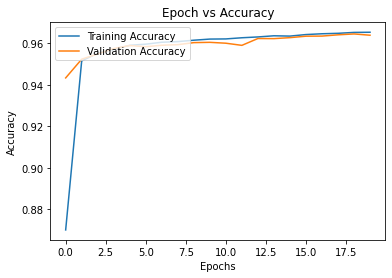

In [38]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['Training Accuracy','Validation Accuracy'],loc='upper left')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.title('Epoch vs Accuracy')

In [39]:
predictions = model.predict(x_val)
#print(predictions)
print(len(new_y(y_val)))
l=get_y(predictions)
print(len(l))
print(classification_report(y_val, l,target_names=["Czech","English","Igbo"]))

21298
21298
              precision    recall  f1-score   support

       Czech       0.96      0.94      0.95      3345
     English       0.96      0.97      0.97      9962
        Igbo       0.96      0.96      0.96      7991

   micro avg       0.96      0.96      0.96     21298
   macro avg       0.96      0.96      0.96     21298
weighted avg       0.96      0.96      0.96     21298
 samples avg       0.96      0.96      0.96     21298



In [40]:
model.save_weights("lstm_model.hd5")

In [41]:

model_1=tf.keras.Sequential([
    tf.keras.Input(shape=(x_train.shape[1],x_train.shape[2])),
    tf.keras.layers.LSTM(5,activation="relu"),
    tf.keras.layers.Dense(8,activation="relu"),
    tf.keras.layers.Dense(3,activation="softmax")
])
model_1.load_weights("lstm_model.hd5")
model_1.compile(optimizer="Adam",loss="binary_crossentropy",metrics=["accuracy"])

model_1.evaluate(x_val,y_val)

666/666 [==============================] - 1s 2ms/step - loss: 0.0659 - accuracy: 0.9639


[0.06594483554363251, 0.9638932943344116]

In [42]:
predictions = model_1.predict(x_val)
l=get_y(predictions)
print(len(l))
print(classification_report(y_val, l,target_names=["Czech","English","Igbo"]))

21298
              precision    recall  f1-score   support

       Czech       0.96      0.94      0.95      3345
     English       0.96      0.97      0.97      9962
        Igbo       0.96      0.96      0.96      7991

   micro avg       0.96      0.96      0.96     21298
   macro avg       0.96      0.96      0.96     21298
weighted avg       0.96      0.96      0.96     21298
 samples avg       0.96      0.96      0.96     21298



In [43]:
x_test=np.array(x_test)
x_pred=model_1.predict(x_test)
for i in range(0,10):
    print(x_pred[i])
    print(y_test[i])
    print("999999")

[0.85396767 0.12925439 0.01677802]
[0, 1, 0]
999999
[3.8424996e-04 9.9929738e-01 3.1828796e-04]
[0, 1, 0]
999999
[8.7815535e-04 9.9707913e-01 2.0427851e-03]
[0, 1, 0]
999999
[0.24330848 0.09164169 0.6650498 ]
[0, 0, 1]
999999
[0.00105499 0.9956202  0.00332478]
[0, 1, 0]
999999
[0.00997687 0.01586196 0.97416115]
[0, 0, 1]
999999
[1. 0. 0.]
[1, 0, 0]
999999
[0.22445941 0.7404093  0.03513126]
[0, 1, 0]
999999
[1. 0. 0.]
[1, 0, 0]
999999
[0.03347893 0.0844268  0.88209426]
[0, 0, 1]
999999


In [44]:
def give_language(a):
    y=get_y(a)
    if y[0][0]==1:
        return "Czech"
    elif y[0][1]==1:
        return "English"
    else:
        return "Igbo"

In [45]:
def give_language_1(a):
    y=get_y([a])
    if y[0][0]==1:
        return "Czech"
    elif y[0][1]==1:
        return "English"
    else:
        return "Igbo"

In [46]:
x_test=np.array(x_test)
x_pred=model_1.predict(x_test)
for i in range(0,20):
    print("The output",x_pred[i])
    print("Preicted Language",give_language_1(x_pred[i]))
    print("Actual Language",give_language_1(y_test[i]))
    print("999999")

The output [0.85396767 0.12925439 0.01677802]
Preicted Language Czech
Actual Language English
999999
The output [3.8424996e-04 9.9929738e-01 3.1828796e-04]
Preicted Language English
Actual Language English
999999
The output [8.7815535e-04 9.9707913e-01 2.0427851e-03]
Preicted Language English
Actual Language English
999999
The output [0.24330848 0.09164169 0.6650498 ]
Preicted Language Igbo
Actual Language Igbo
999999
The output [0.00105499 0.9956202  0.00332478]
Preicted Language English
Actual Language English
999999
The output [0.00997687 0.01586196 0.97416115]
Preicted Language Igbo
Actual Language Igbo
999999
The output [1. 0. 0.]
Preicted Language Czech
Actual Language Czech
999999
The output [0.22445941 0.7404093  0.03513126]
Preicted Language English
Actual Language English
999999
The output [1. 0. 0.]
Preicted Language Czech
Actual Language Czech
999999
The output [0.03347893 0.0844268  0.88209426]
Preicted Language Igbo
Actual Language Igbo
999999
The output [9.8844764e-16 1.

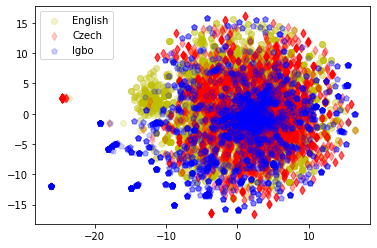

In [47]:
from sklearn.manifold import TSNE
tsne=TSNE(n_components=2,random_state=21)
x_test=np.array(x_test)
x_test= x_test.reshape((x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
X=tsne.fit_transform(x_test)
y_test_2=new_y(y_test)
plt.scatter(X[np.where(y_test_2==1),0],X[np.where(y_test_2==1),1],marker='o',color='y',label='English',alpha=0.2)
plt.scatter(X[np.where(y_test_2==2),0],X[np.where(y_test_2==2),1],marker='d',color='r',label='Czech',alpha=0.2)
plt.scatter(X[np.where(y_test_2==3),0],X[np.where(y_test_2==3),1],marker='p',color='b',label='Igbo',alpha=0.2)
plt.legend(loc='best')